In [7]:
#test the geo distance matrix, added in the function files
#weighted cluster method
library('data.table')
library('ggplot2')
library('ggmap')
library('dbscan')
library('dplyr')
funPath='D:/Git/Rprojects/ECA/function.R'
source(funPath)

In [2]:
dataPath='C:/Users/wzh/Desktop/compressed_trajectory_215896000.csv'
dataPath2='D:/Git/data/container/215896000.txt'
dataPath3='D:/Git/data/ECAContainerSpeedLessThanOneKnot/3438807_3.csv'
#dt=fread(file=dataPath);setnames(dt,c('mmsi','time','sog','lon','lat','status'));head(dt)
#dt=fread(file=dataPath);setnames(dt,c('mmsi','time','sog','lon','lat'));head(dt)
dt=fread(file=dataPath3)[,list(mmsi,time,sog,lon,lat,status)];head(dt)

Read 3438807 rows and 8 (of 8) columns from 0.194 GB file in 00:00:13


mmsi,time,sog,lon,lat,status
477865000,1395370645,0,121.6568,31.33707,0
477865000,1395370646,0,121.6568,31.33707,0
477865000,1395370656,0,121.6568,31.33707,0
477865000,1395370666,0,121.6568,31.33707,0
477865000,1395370685,1,121.6568,31.33707,0
477865000,1395370695,0,121.6568,31.33707,0


In [3]:
setkey(dt,mmsi,time)
dt=dt[sog==0];nrow(dt)
set.seed(1234)
sampledt=sample_n(dt,100000)[status==5];nrow(sampledt)

[1] 2222913

[1] 43803

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=30.863602,121.505192&zoom=8&size=640x640&scale=2&maptype=roadmap&language=en-EN&sensor=false


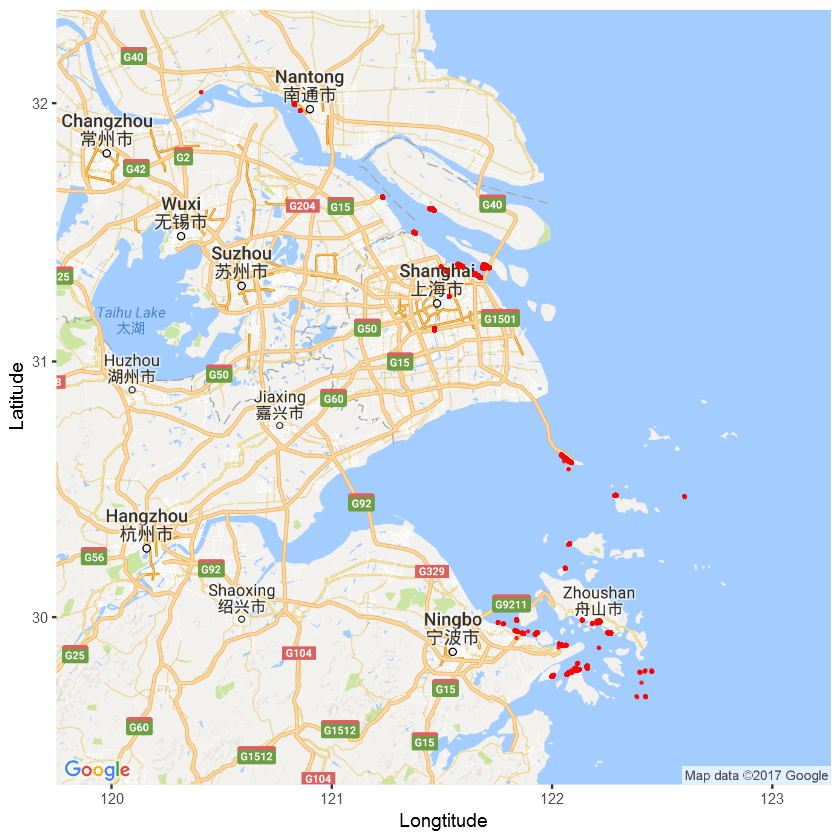

In [4]:
zoomSize=8
temp=sampledt
centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'roadmap'))
#p=p+geom_path(data=temp,aes(x=lon,y=lat),color='green',size=0.1)
p=p+geom_point(data=temp,aes(x=lon,y=lat),color='red',size=0.2,alpha=0.75)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.9,0.2))
p

[1] 25

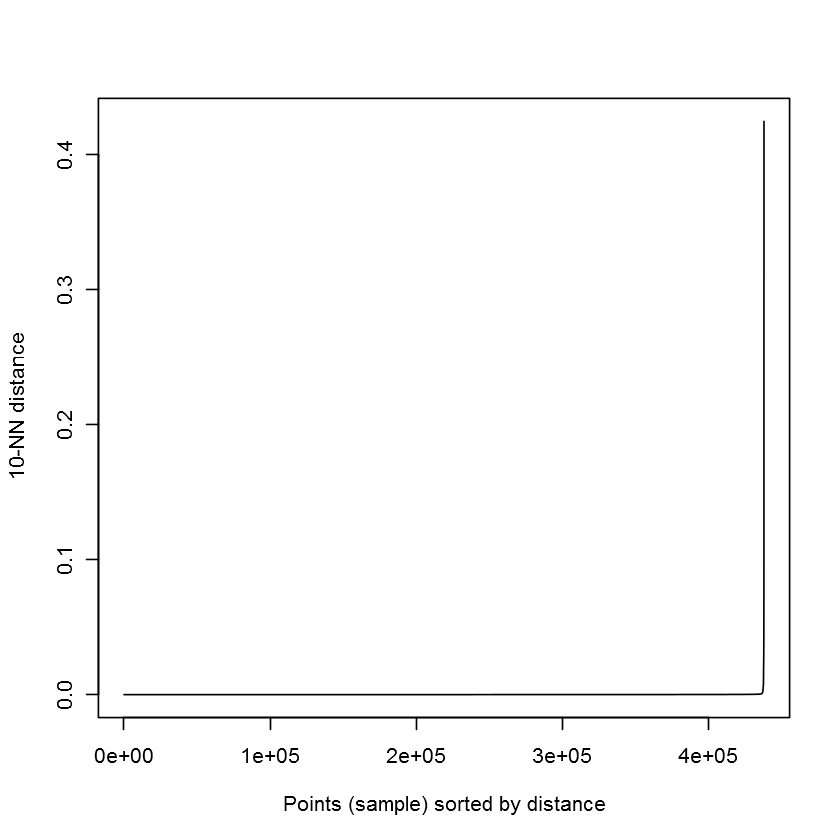

In [36]:
dt1 <- as.matrix(sampledt[,list(lon,lat)])
kNNdistplot(dt1, k=10)
## the knee is around a distance of .4
cl <- dbscan(dt1, eps = 0.01, minPts =20)
dt2=data.table(cbind(sampledt,c=cl$cluster));
nrow(dt2[,.N,c])-1

In [48]:
#head(dt2)
dt2[,.N,by=list(c,mmsi)][,mmsi,c][,.N,c]

c,N
1,144
2,20
3,136
4,93
5,283
6,2
7,130
8,12
9,15
10,63


[1] 43696

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=30.882608,121.559047&zoom=8&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false


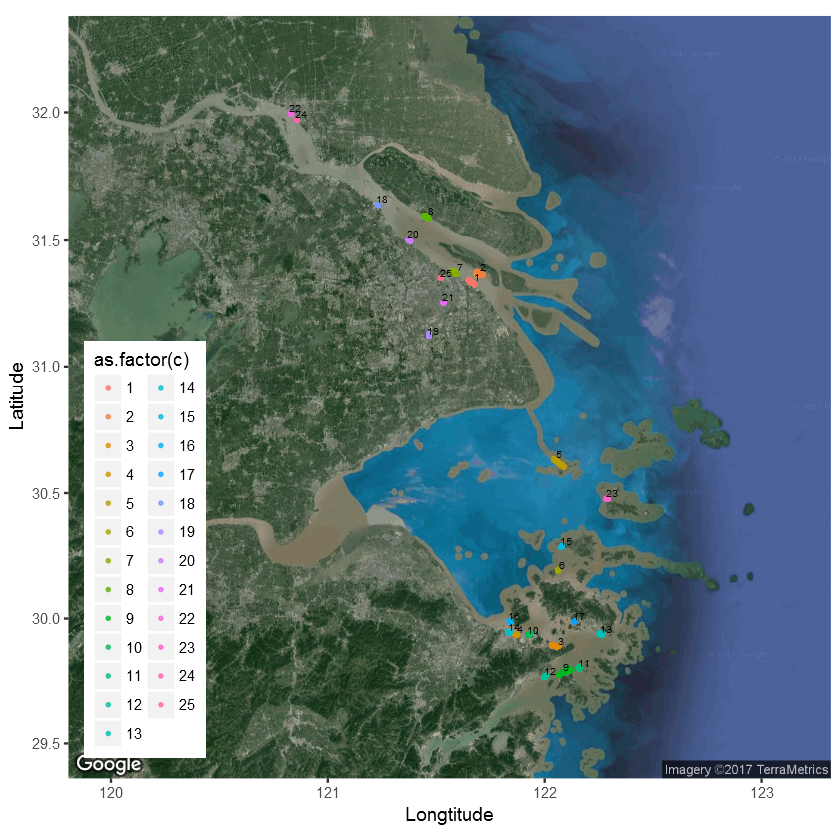

In [58]:
zoomSize=8
temp=dt2[c>0];nrow(temp)
centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.02,nudge_y = 0.02,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

[1] 5061

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=30.620148,122.064262&zoom=14&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_text)."

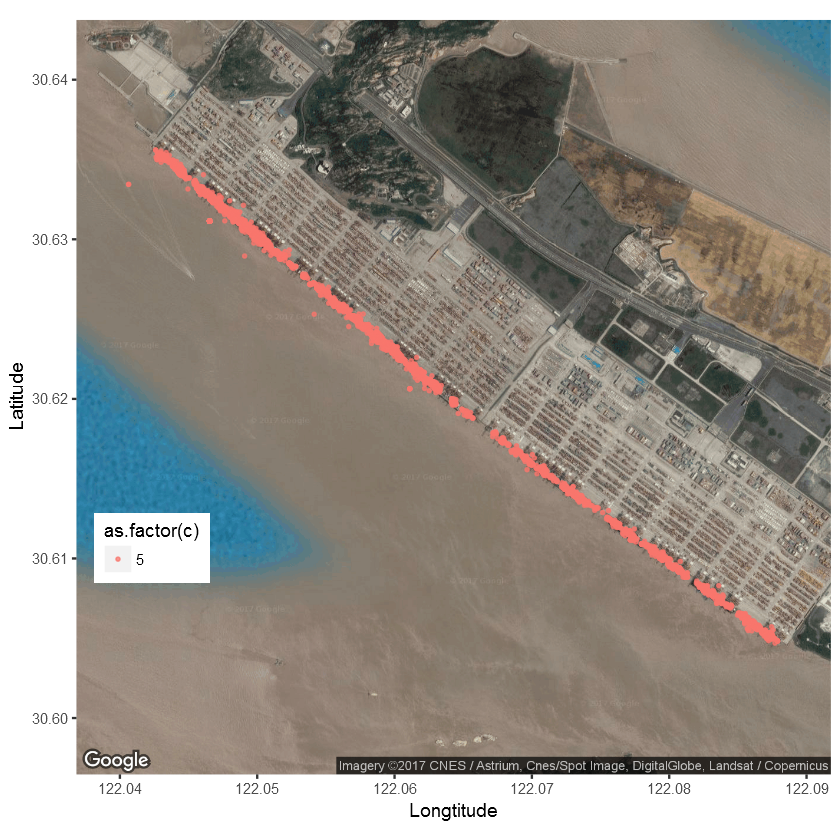

In [54]:
zoomSize=14
temp=dt2[c==5];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

#### as shown from above figure, we can see that the shape of a terminal or a group of berths are a narrow rectangle.This feature may be able to be used to remove clusters which are not really a berth such archor area

[1] 8034

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=31.333872,121.662067&zoom=14&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_text)."

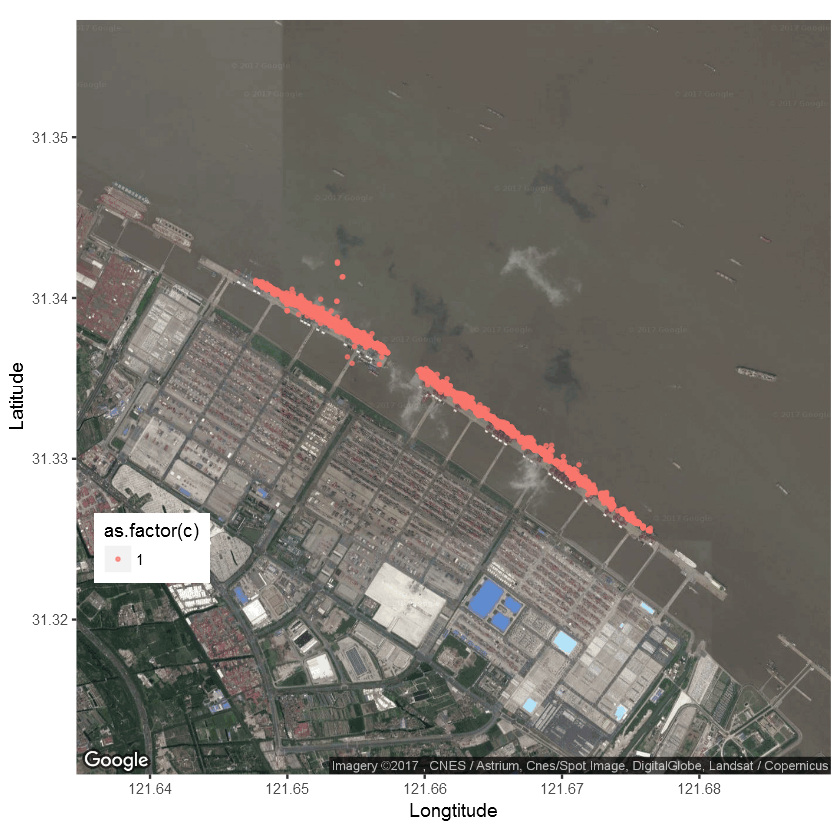

In [31]:
zoomSize=14
temp=dt2[c==1];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

[1] 6596

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=31.367943,121.69918&zoom=16&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 3207 rows containing missing values (geom_point)."Warning message:
"Removed 1 rows containing missing values (geom_text)."

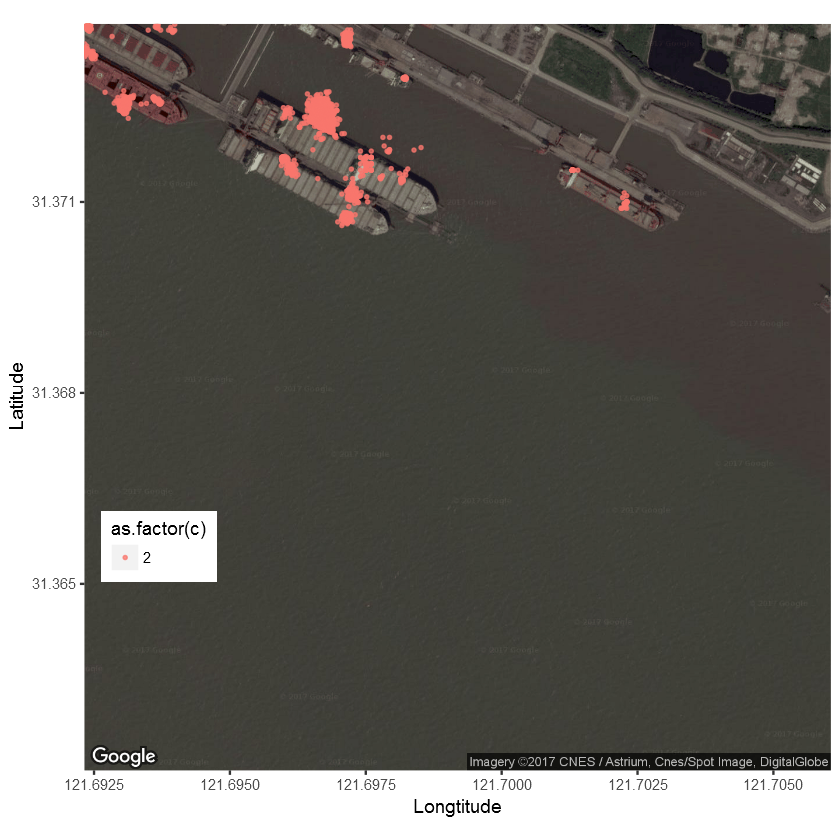

In [57]:
zoomSize=16
temp=dt2[c==2];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

[1] 46

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=30.192672,122.059848&zoom=16&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_text)."

mmsi,time,sog,lon,lat,status,c
564897000,1389700633,0,122.0605,30.19142,5,6
564897000,1389730148,0,122.0605,30.19142,5,6
564897000,1389714854,0,122.0605,30.19142,5,6
564897000,1389717373,0,122.0605,30.19140,5,6
564897000,1389953184,0,122.0605,30.19140,5,6
564897000,1389664271,0,122.0605,30.19147,5,6


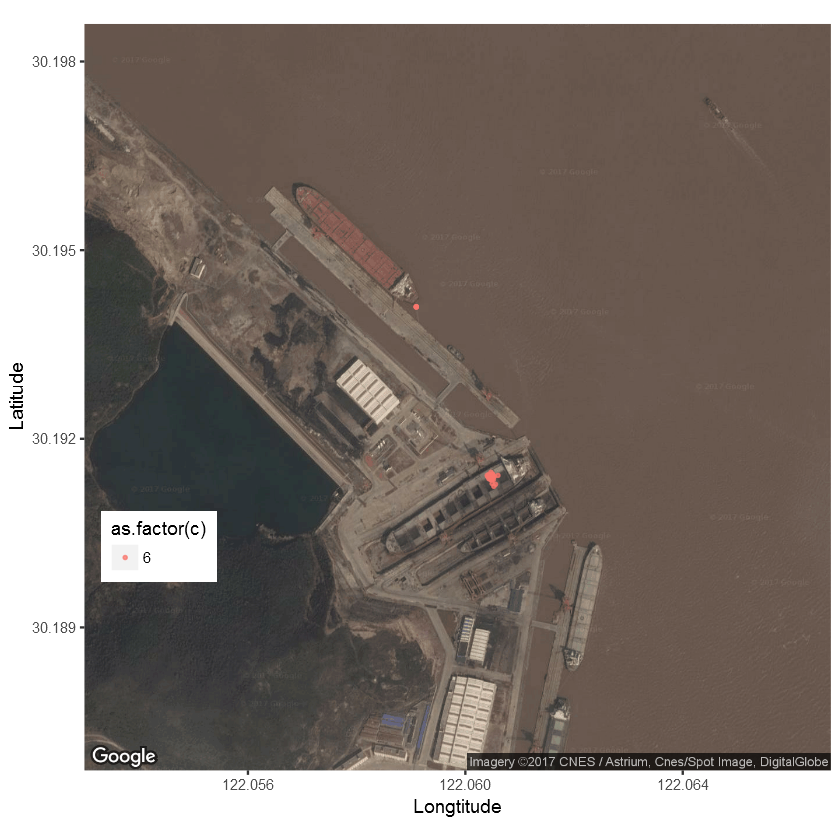

In [56]:
zoomSize=16
temp=dt2[c==6];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p
head(temp)

[1] 139

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=30.286851,122.077603&zoom=14&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_text)."

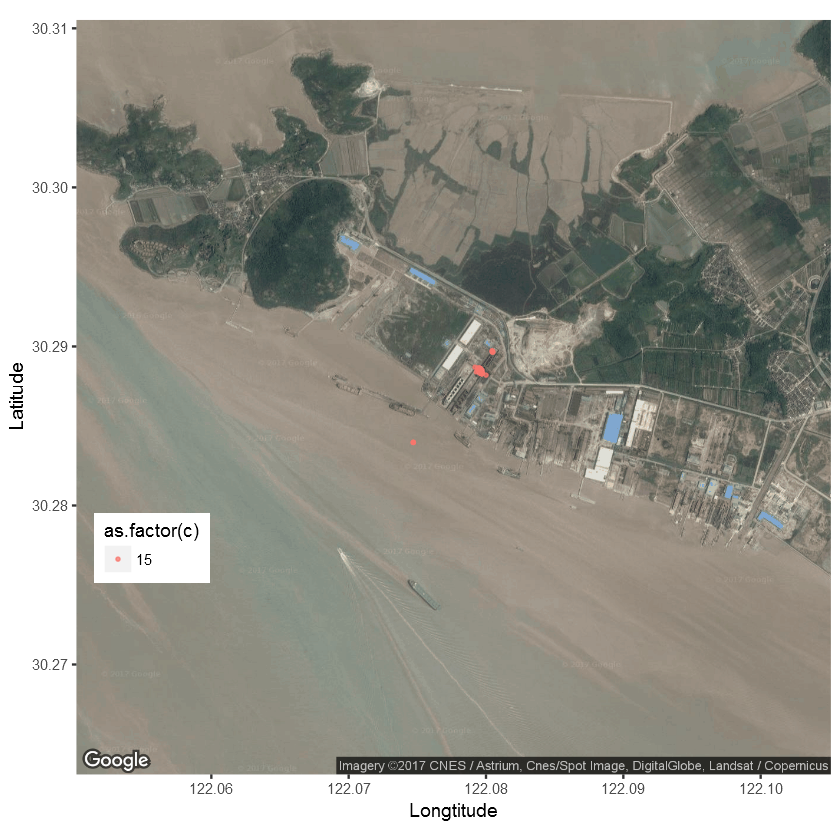

In [25]:
zoomSize=14
temp=dt2[c==15];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

[1] 790

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=29.936194,121.928189&zoom=14&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_text)."

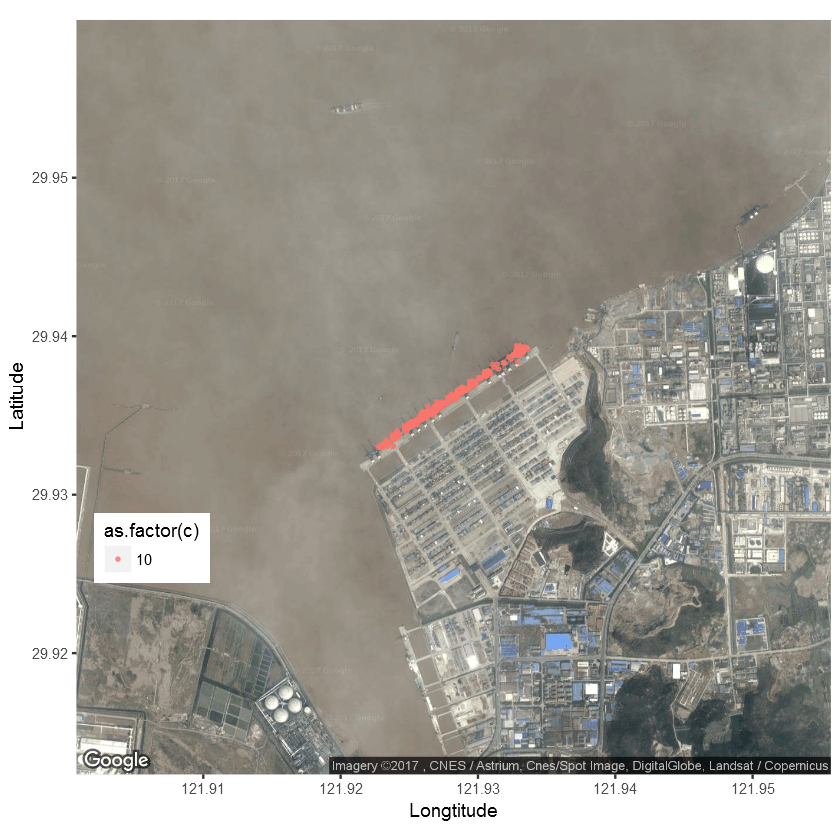

In [26]:
zoomSize=14
temp=dt2[c==10];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

[1] 1701

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=29.936091,121.867519&zoom=14&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_text)."

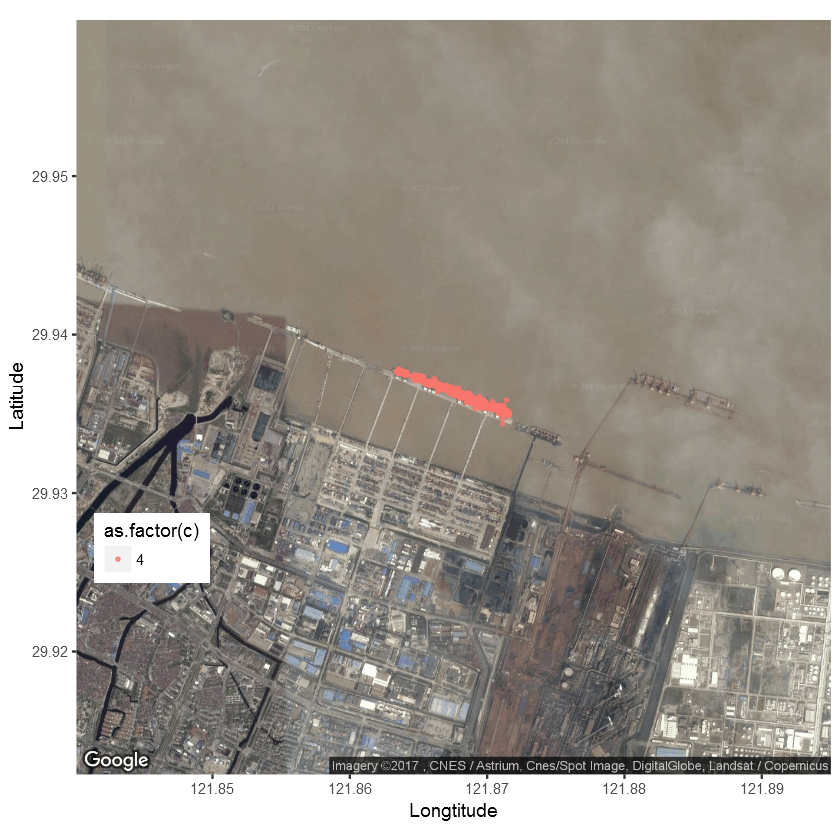

In [27]:
zoomSize=14
temp=dt2[c==4];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

[1] 1494

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=29.945429,121.837314&zoom=14&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 1 rows containing missing values (geom_text)."

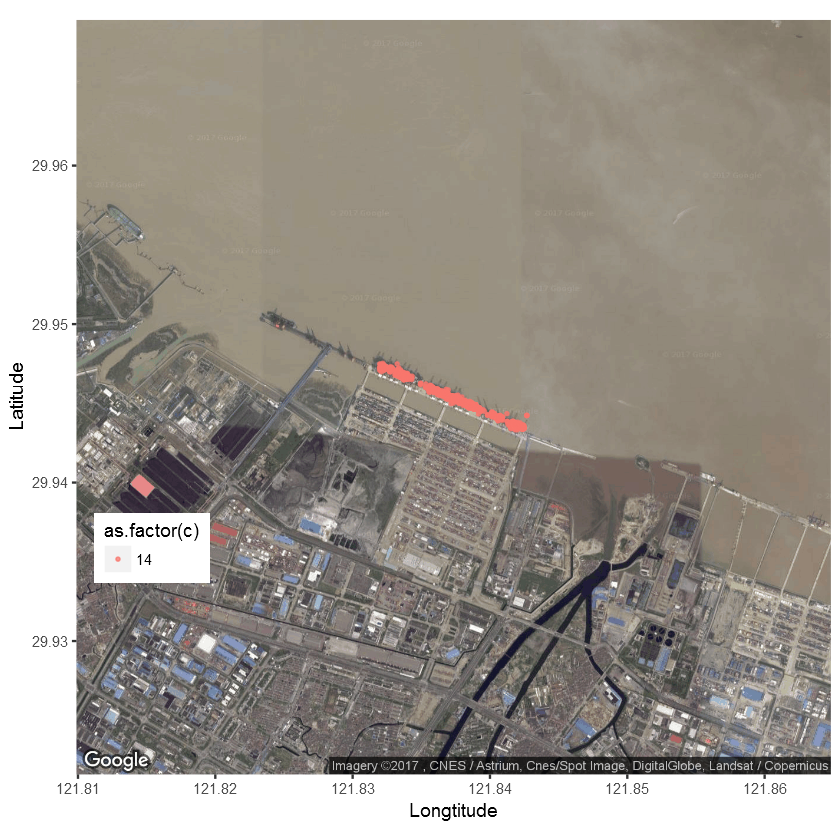

In [28]:
zoomSize=14
temp=dt2[c==14];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p

[1] 329

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=31.500249,121.376342&zoom=17&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
"Removed 145 rows containing missing values (geom_point)."Warning message:
"Removed 1 rows containing missing values (geom_text)."

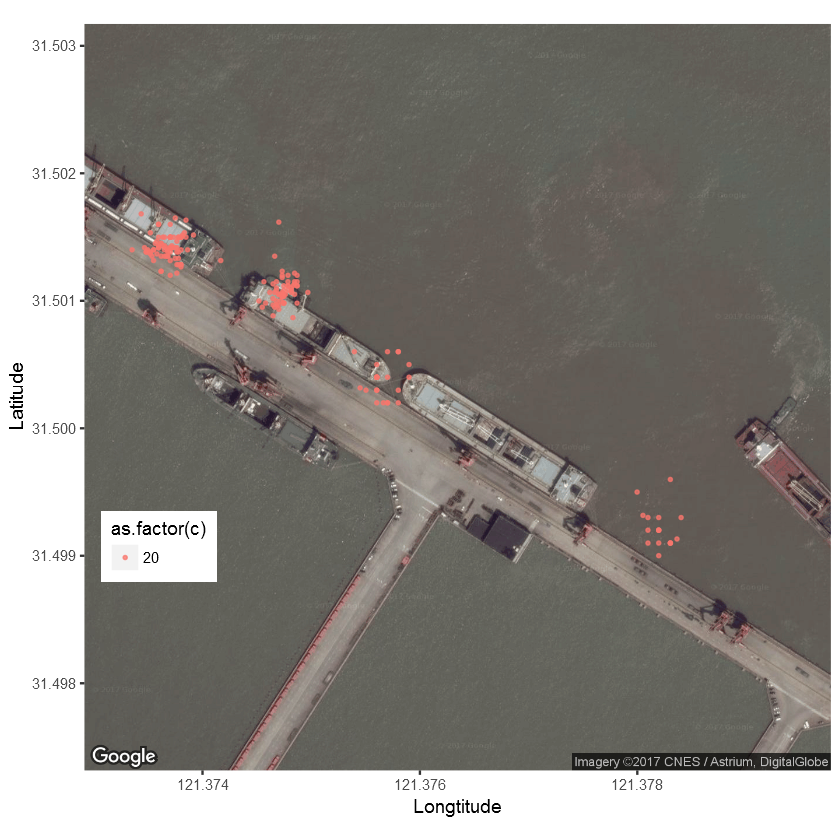

In [50]:
zoomSize=17
temp=dt2[c==20];nrow(temp)

centerX=0.5*(max(temp$lon)+min(temp$lon))
centerY=0.5*(max(temp$lat)+min(temp$lat))
p<-ggmap(get_map(location=c(centerX,centerY),zoom=zoomSize,source='google',maptype = 'satellite'))

p=p+geom_point(data=temp,aes(x=lon,y=lat,col=as.factor(c)),size=0.5,alpha=0.75)
p=p+geom_text(data=temp[,.SD[1],c],nudge_x = 0.05,nudge_y = 0.05,aes(x=lon,y=lat,label=c),color='black',size=2)
p=p+labs(x="Longtitude",y="Latitude")+theme(legend.position=c(0.1,0.3))
p